In [2]:
import numpy as np
from scipy.io import wavfile
from scipy import signal
from sklearn.decomposition import FastICA
import matplotlib.pyplot as plt
from IPython.display import Audio

# Poor man's beamforming and ICA

In [3]:
sample_rate, audio_raw = wavfile.read("../data/raw/noisy_mixture_32ch.wav")
audio_raw = audio_raw.T.astype(np.float64)
audio_raw = (audio_raw - audio_raw.mean(axis=1, keepdims=True)) / np.abs(audio_raw).max(axis=1, keepdims=True)

speech_idx = int(2/32 * audio_raw.shape[1])

In [4]:
print(f"Speech index: {speech_idx}")
print(f"Audio shape: {audio_raw.shape}")

Speech index: 82687
Audio shape: (32, 1323000)


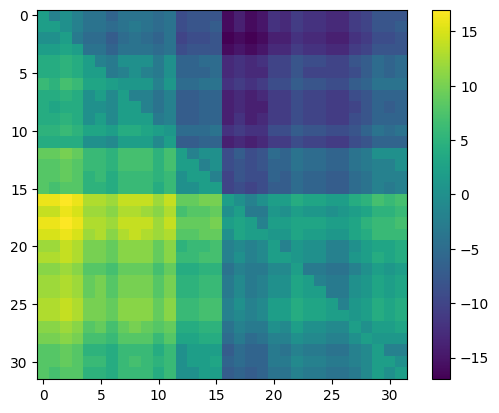

In [5]:
def get_lags(audio: np.ndarray):
    audio_fft = np.fft.rfft(audio, axis=1)
    audio_fft_rev = np.fft.rfft(audio[:, ::-1], axis=1)

    max_lags = np.zeros((audio.shape[0], audio.shape[0]), dtype=np.int64)
    
    for i in range(audio.shape[0]):
        for j in range(i, audio.shape[0]):
            corr = np.fft.irfft(audio_fft[i] * audio_fft_rev[j])
            max_lag = np.argmax(np.abs(corr))
            if abs(max_lag) > audio.shape[1]//2:
                max_lag = max_lag - audio.shape[1]
            max_lags[i, j] = max_lag
            max_lags[j, i] = -max_lags[i, j]

    return max_lags


lags = get_lags(audio_raw[:, :speech_idx])
plt.imshow(lags)
plt.colorbar()
plt.show()

In [6]:
audio_aligned = np.zeros(audio_raw.shape)

for i in range(32):
    right_pad = max(0, -lags[0, i])
    left_pad = max(0, lags[0, i])
    # if right_pad > 0:
    if right_pad >= 0:
        # audio_aligned[i] += np.pad(audio_raw[i], (right_pad, 0))[:-right_pad]
        audio_aligned[i] = np.pad(audio_raw[i], (0, right_pad))[right_pad:]
    else:
        # audio_aligned[i] += np.pad(audio_raw[i], (0, left_pad))[left_pad:]
        audio_aligned[i] = np.pad(audio_raw[i], (left_pad, 0))[:-left_pad]
        
Audio(audio_aligned.mean(0), rate=sample_rate)

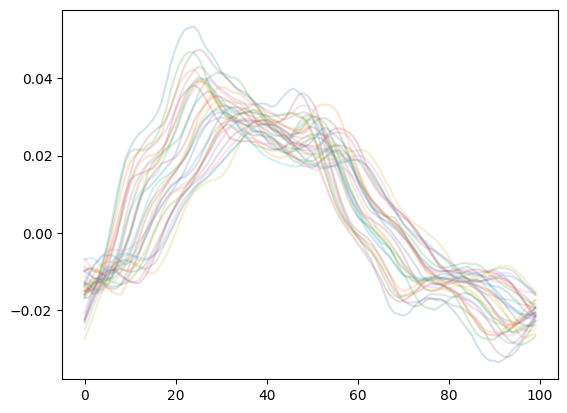

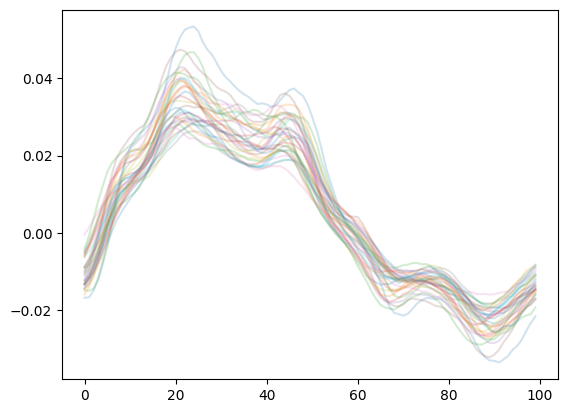

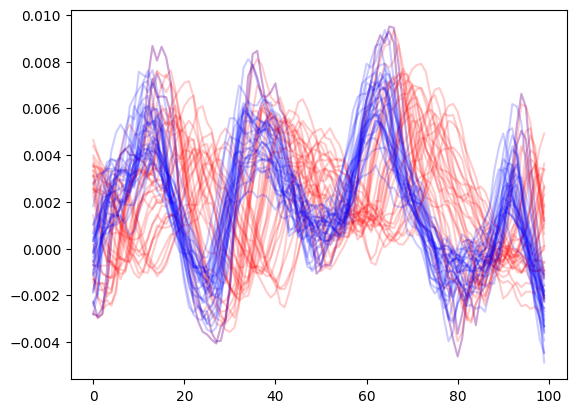

In [7]:
range_start = 100000
range_length = 100

plt.plot(audio_raw[:, range_start:range_start+range_length].T, alpha=0.2)
plt.show()

plt.plot(audio_aligned[:, range_start:range_start+range_length].T, alpha=0.2)
plt.show()

plt.plot(audio_raw[:, :100].T, color="red", alpha=0.2)
plt.plot(audio_aligned[:, :100].T, color="blue", alpha=0.2)
plt.show()

In [147]:
ica = FastICA(n_components=32, fun="cube", max_iter=200)
sources = ica.fit_transform(audio_aligned[:, :speech_idx*8].T)
# sources = ica.fit_transform(audio_raw[:, :speech_idx*8].T)
sources = sources.T

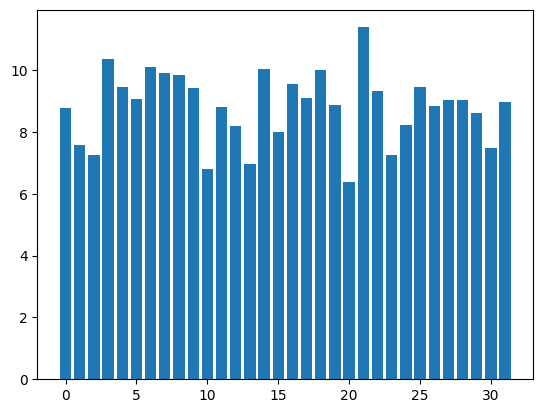

In [148]:
importance = np.abs(audio_aligned[:, :speech_idx] @ sources[:, :speech_idx].T).sum(0)
# importance = np.abs(audio_raw[:, :speech_idx] @ sources[:, :speech_idx].T).sum(0)
plt.bar(range(len(importance)), np.log(importance))
plt.show()

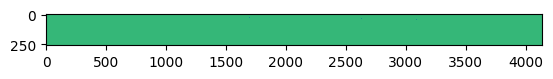

In [149]:
plt.imshow((1-(1- softmax(np.abs(noise_fft)/20, axis=0).mean(0) / softmax(np.abs(noise_fft)/20, axis=0).mean(0).max(0))))
plt.show()

In [150]:
voice_idx = np.argpartition(importance, -4)[-4:]
noise_idx = np.argpartition(-importance, -4)[-4:]


window = signal.windows.hann(512)
stft = signal.ShortTimeFFT(window, 160, sample_rate)
voice_fft = stft.stft(sources[voice_idx], axis=1)
noise_fft = stft.stft(sources[noise_idx], axis=1)


from scipy.special import softmax
# voice_clean_fft = voice_fft.mean(0) * (1-(1- np.abs(noise_fft).mean(0) / np.abs(noise_fft).mean(0).max())**4)
voice_clean_fft = voice_fft.mean(0) * ((1- softmax(np.abs(noise_fft)/20, axis=0).mean(0) / softmax(np.abs(noise_fft)/20, axis=0).mean(0).max(0)))
voice_clean = stft.istft(voice_clean_fft).squeeze()
display(Audio(sources[voice_idx], rate=sample_rate))
display(Audio(voice_clean, rate=sample_rate))

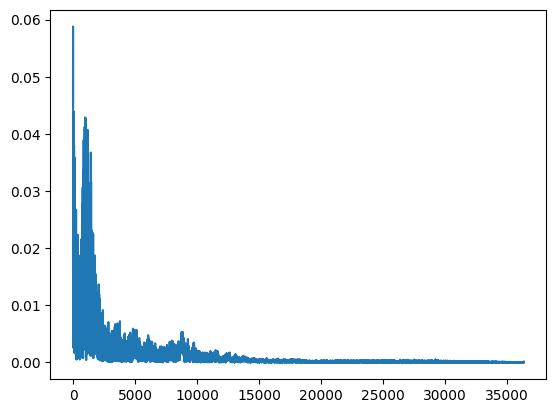

In [494]:
ft = np.fft.rfft(audio_aligned[:, :speech_idx], axis=1)
plt.plot(np.abs(ft[:, 5000:100000].mean(0)) / np.abs(ft[:, 5000:100000].mean(0).sum()))
plt.show()

In [472]:
np.abs(ft).shape

(32, 41344)

In [468]:
np.pad(np.abs(ft) / np.abs(ft).mean(0).sum(), ((0,0), (0, 4*speech_idx))).shape

(32, 206718)

In [469]:
np.fft.rfft(audio_aligned, axis=1).shape

(32, 661501)

In [497]:
# ft_full = np.fft.rfft(audio_aligned, axis=1)
# ft_scale = np.abs(ft) / np.abs(ft).mean(0).sum()
# Audio(np.fft.irfft(ft_full * np.pad(ft_scale, ((0,0), (0, ft_full.shape[1]-ft_scale.shape[1])))).mean(0), rate=sample_rate)
ft_full = np.fft.rfft(audio_aligned, axis=1)
ft_scale = np.zeros((32, 100000))
ft_scale[:, 10000:100000] = np.cos(np.linspace(np.pi/2, np.pi/2, 100000-10000))**2
Audio(np.fft.irfft(ft_full * np.pad(ft_scale, ((0,0), (0, ft_full.shape[1]-ft_scale.shape[1])))).mean(0), rate=sample_rate)

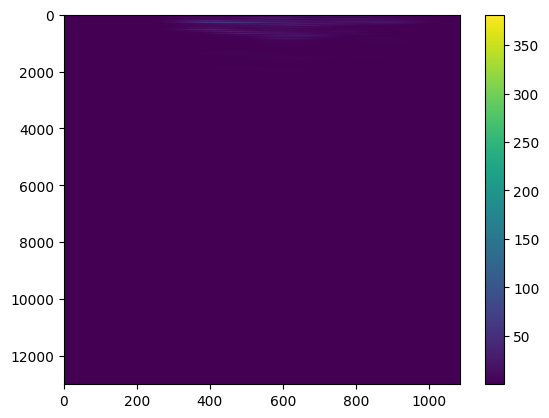

In [452]:
window = signal.windows.hann(2*13000)
stft = signal.ShortTimeFFT(window, 100, sample_rate)
ft = np.abs(stft.stft(audio_aligned[:, :speech_idx], axis=1))
plt.imshow(ft.mean(0), aspect="auto")
plt.colorbar()
plt.show()